$\Large\color{blue}{\text{PyGMTSAR Yamchi Dam Sentinel-1 SLC Timeseries Analysis}}$

$\Large\color{blue}{\text{Scenes on Alaska Satellite Facility (ASF) for POINT(48.0768 38.3)}}$

See
http://mgviz.ucsd.edu/?mission=ESESES

https://github.com/gmtsar/2022-unavco-course-gmtsar/blob/main/Jupyter/gmtsar_correcting_intf_with_gps_example.ipynb

http://geodesy.unr.edu/NGLStationPages/gpsnetmap/GPSNetMap.html

https://topex.ucsd.edu/gmtsar/tar/sentinel_time_series_4.pdf

https://search.asf.alaska.edu/

### See and more PyGMTSAR notebooks on GitHub: [PyGMTSAR](https://github.com/mobigroup/gmtsar)

It works on

* MacOS Monterey (Apple Silicon) and BigSur (Intel) (Python 3.9) - please pre-install system dependencies (maybe using HomeBrew),

* Google Cloud VM and Notebooks on Debian 10 (Python 3.7), use the [Google Cloud Debian 10 init script](https://github.com/mobigroup/gmtsar/blob/master/gmtsar/sh/GMTSAR.install.debian10.sh) and [Google Cloud Debian 10 VM creation script](https://github.com/mobigroup/gmtsar/blob/master/gmtsar/sh/GMTSAR.gcloud_create_debian10.sh)

* $\color{red}{\text{Google Colab (Python 3.7) - you will be asked to re-run the notebook once due to "system crash" by desing}}$
$\color{red}{\text{Note: to open all notebook cells select menu "View" -> "Expand Sections"}}$

### PyGMTSAR is my free-time Open Source project.

That's a bit curious how the project was started a year ago. I develop geophysical inversion methods and processing software for many years using my fundamental physics and mathematics background. Satellite interferometry is the key point to validate my inversion models and I found the same problem as you too that the existing interferometry packages usage is a pain. There is no interactive processing with multiprocessing and even a progressbar and ability to view and change every step code and validate the results. Also, many used algorithms are too outdated and produce terrible results like to tension surfaces in GMT which is used widely in GMTSAR (hmm, how about to control a smothness of derivative? Tension surfaces were invented when all the Earths computers where less powerfull than your smarthone today. If you are interested I shared the examples in GMTSAR bug tracker). Anyway, I found GMT mathematics is really crazy and the developers replace one incorrect algorithm by another and back often as we see in the codes and the changelog). That was enough reason to check all the used algorithms and replace these by modern and correct ones. By this way, I use only GMTSAR C codes with my patches to fix some errors and allow interoperability with Python wrappers plus my own codes around them. GMTSAR codes are fine and without crazy GMT codes work better and the processing is much faster. Alright, I spent one month to make the initial PyGMTSAR realization and it works. Recently, I returned to the project to add some more sophisticated features like to scenes and subswathes stitching. I'm going to share some of my geological exprorations and seismic models as live examples on Google Colab as soon as it will be possible to do. How lineaments and ore zones are related to interferograms? How gas and oil deposits are related to surface movements on interferometry displacement maps? I have the answer and I work on the tools to model and visualize them.

You'd find my theoretical models and processing codes foir geophisical inversions in Github repository https://github.com/mobigroup/gis-snippets and tools for the 4D results vizualization in https://github.com/mobigroup/ParaView-plugins

Ah yes, a little bit about me. I have STEM master's degree in radio physics and in 2004 I was awarded first prize of the All-Russian Physics competition for significant results in Inverse modeling for non-linear optics and holography, also applicable for Inverse Modeling of Gravity, Magnetic, and Thermal fields. In addition to my fundamental science knowledge, I’m world class data scientist and software developer with 20 years experience in science and industrial development. I have worked on government contracts and universities projects and on projects for LG Corp, Google Inc, etc. You are able to find some of my software and results on LinkedIn and GitHub and Upwork. By the way, I left Russia many years ago and I work remotely for about 20 years.

### To order some research, development and support see my profile on freelance platform [Upwork](https://www.upwork.com/freelancers/~01e65e8e7221758623)

### @ Alexey Pechnikov, August, 2022

[Geological models on YouTube channel](https://www.youtube.com/channel/UCSEeXKAn9f_bDiTjT6l87Lg)

[Augmented Reality (AR) Geological Models](https://mobigroup.github.io/ParaView-Blender-AR/)

[GitHub repositories](https://github.com/mobigroup)

[English posts and articles on LinkedIn](https://www.linkedin.com/in/alexey-pechnikov/)

[Russian articles on Habr](https://habr.com/ru/users/N-Cube/posts/)

## Load Modules to Check Environment

In [1]:
import platform, sys, os

## Load and Setup Python Modules

In [2]:
import xarray as xr
import numpy as np
import pandas as pd
import geopandas as gpd
# supress numpy warnings
import warnings
warnings.filterwarnings('ignore')

In [3]:
# plotting modules
import hvplot.pandas  # noqa
import hvplot.xarray  # noqa
import holoviews as hv
pd.options.plotting.backend = 'hvplot'
from IPython.display import Image
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline

In [4]:
# define Pandas display settings
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

## Load Custom Python Modules

In [5]:
from pygmtsar import PRM, SBAS

## Define 3 Sentinel-1 Scenes and Processing Parameters

When you need more scenes and SBAS analysis  see examples on PyGMTSAR GitHub page https://github.com/mobigroup/gmtsar

### Descending Orbit Configuration

### Ascending Orbit Configuration

In [6]:
ORBIT     = 'A'

## Common Configuration

In [7]:
BACKUP       = 'backup_asc' if ORBIT == 'A' else 'backup_desc'
WORKDIR      = 'raw_asc' if ORBIT == 'A' else 'raw_desc'
DEMFILE      = None
POLARIZATION = 'VV'
# SBAS parameters
BASEDAYS     = 65
BASEMETERS   = 150

In [8]:
# Yamchi Dam area location to check correlation map
aoi_lon, aoi_lat = 48.0757, 38.0582
# radius of area around Yamchi Dam, [decimal degrees]
RADIUS = 0.05
# define it using correlation stack pictures below
# also, that's possible to unwrap without the threshold
#CORRLIMIT = 0.2
CORRSTACKLIMIT = 0.2

## AOI

Use GeoJSON file or shapefile or define the area by points as below.

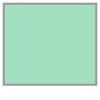

In [9]:
# read from GeoJSON file or shapefile
AOI = gpd.read_file('AOI.geojson')
AOI = AOI.geometry[0]
AOI

## Run Local Dask Cluster

For multicore processing of the all big rasters launch Dask cluster

In [10]:
from dask.distributed import Client
client = Client()

## Restore SBAS

In [11]:
sbas = SBAS.restore(WORKDIR)

NOTE: load state from file raw_asc/SBAS.pickle


In [12]:
sbas.to_dataframe()

,datetime,orbit,mission,polarization,subswath,datapath,metapath,orbitpath,geometry
date,,,,,,,,,
2020-01-02,2020-01-02 14:44:58,A,S1A,VV,2,raw_asc/s1a-iw2-slc-vv-20200102t144458-20200102t144507-030623-03823a-005.tiff,raw_asc/s1a-iw2-slc-vv-20200102t144458-20200102t144507-030623-03823a-005.xml,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_OPER_AUX_POEORB_OPOD_20210316T184157_V20200101T225942_20200103T005942.EOF,"POLYGON ((47.46451 39.30777, 47.84950 37.54856, 48.93133 37.78531, 48.54634 39.54452, 47.46451 39.30777))"
2020-01-14,2020-01-14 14:44:58,A,S1A,VV,2,raw_asc/s1a-iw2-slc-vv-20200114t144458-20200114t144506-030798-03885a-005.tiff,raw_asc/s1a-iw2-slc-vv-20200114t144458-20200114t144506-030798-03885a-005.xml,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_OPER_AUX_POEORB_OPOD_20210316T223042_V20200113T225942_20200115T005942.EOF,"POLYGON ((47.46432 39.30797, 47.84929 37.54877, 48.93112 37.78551, 48.54615 39.54471, 47.46432 39.30797))"
2020-01-26,2020-01-26 14:44:58,A,S1A,VV,2,raw_asc/s1a-iw2-slc-vv-20200126t144458-20200126t144506-030973-038e84-005.tiff,raw_asc/s1a-iw2-slc-vv-20200126t144458-20200126t144506-030973-038e84-005.xml,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_OPER_AUX_POEORB_OPOD_20210317T022152_V20200125T225942_20200127T005942.EOF,"POLYGON ((47.46517 39.30759, 47.85009 37.54841, 48.93162 37.78506, 48.54670 39.54424, 47.46517 39.30759))"
2020-02-07,2020-02-07 14:44:57,A,S1A,VV,2,raw_asc/s1a-iw2-slc-vv-20200207t144457-20200207t144506-031148-03949f-005.tiff,raw_asc/s1a-iw2-slc-vv-20200207t144457-20200207t144506-031148-03949f-005.xml,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_OPER_AUX_POEORB_OPOD_20210317T061343_V20200206T225942_20200208T005942.EOF,"POLYGON ((48.92003 37.78443, 48.57084 39.38058, 47.50996 39.14850, 47.85914 37.55235, 48.92003 37.78443))"
2020-02-19,2020-02-19 14:44:57,A,S1A,VV,2,raw_asc/s1a-iw2-slc-vv-20200219t144457-20200219t144505-031323-039aac-005.tiff,raw_asc/s1a-iw2-slc-vv-20200219t144457-20200219t144505-031323-039aac-005.xml,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_OPER_AUX_POEORB_OPOD_20210317T100523_V20200218T225942_20200220T005942.EOF,"POLYGON ((48.91966 37.78403, 48.57044 39.38019, 47.50958 39.14808, 47.85880 37.55193, 48.91966 37.78403))"
2020-03-02,2020-03-02 14:44:57,A,S1A,VV,2,raw_asc/s1a-iw2-slc-vv-20200302t144457-20200302t144505-031498-03a0af-005.tiff,raw_asc/s1a-iw2-slc-vv-20200302t144457-20200302t144505-031498-03a0af-005.xml,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_OPER_AUX_POEORB_OPOD_20210317T135251_V20200301T225942_20200303T005942.EOF,"POLYGON ((48.91937 37.78395, 48.56998 39.38072, 47.50913 39.14860, 47.85851 37.55183, 48.91937 37.78395))"
2020-03-14,2020-03-14 14:44:57,A,S1A,VV,2,raw_asc/s1a-iw2-slc-vv-20200314t144457-20200314t144505-031673-03a6c2-005.tiff,raw_asc/s1a-iw2-slc-vv-20200314t144457-20200314t144505-031673-03a6c2-005.xml,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_OPER_AUX_POEORB_OPOD_20210317T173827_V20200313T225942_20200315T005942.EOF,"POLYGON ((48.91874 37.78379, 48.56944 39.38018, 47.50860 39.14807, 47.85789 37.55167, 48.91874 37.78379))"
2020-03-26,2020-03-26 14:44:57,A,S1A,VV,2,raw_asc/s1a-iw2-slc-vv-20200326t144457-20200326t144505-031848-03aceb-005.tiff,raw_asc/s1a-iw2-slc-vv-20200326t144457-20200326t144505-031848-03aceb-005.xml,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_OPER_AUX_POEORB_OPOD_20210317T212403_V20200325T225942_20200327T005942.EOF,"POLYGON ((48.91976 37.78363, 48.57056 39.37989, 47.50972 39.14782, 47.85892 37.55156, 48.91976 37.78363))"
2020-04-07,2020-04-07 14:44:57,A,S1A,VV,2,raw_asc/s1a-iw2-slc-vv-20200407t144457-20200407t144506-032023-03b316-005.tiff,raw_asc/s1a-iw2-slc-vv-20200407t144457-20200407t144506-032023-03b316-005.xml,/Volumes/DISK/work/Yamchi/data/asc/2020/S1A_OPER_AUX_POEORB_OPOD_20210318T011506_V20200406T225942_20200408T005942.EOF,"POLYGON ((48.92057 37.78384, 48.57134 39.38047, 47.51052 39.14844, 47.85976 37.55181, 48.92057 37.78384))"


## Rebuild SBAS Pairs

In [13]:
baseline_pairs = sbas.baseline_pairs(days=BASEDAYS, meters=BASEMETERS)
print (f'Found SBAS pairs: {len(baseline_pairs)}')

Found SBAS pairs: 139


In [14]:
baseline_pairs

,ref_date,rep_date,ref_timeline,ref_baseline,rep_timeline,rep_baseline
0,2020-01-02,2020-01-14,2020.00,10.03,2020.03,0.07
1,2020-01-02,2020-01-26,2020.00,10.03,2020.06,16.25
2,2020-01-02,2020-02-07,2020.00,10.03,2020.10,53.57
3,2020-01-02,2020-02-19,2020.00,10.03,2020.13,16.04
4,2020-01-02,2020-03-02,2020.00,10.03,2020.16,-17.22
5,2020-01-14,2020-01-26,2020.03,0.07,2020.06,16.25
6,2020-01-14,2020-02-07,2020.03,0.07,2020.10,53.57
7,2020-01-14,2020-02-19,2020.03,0.07,2020.13,16.04
8,2020-01-14,2020-03-02,2020.03,0.07,2020.16,-17.22
9,2020-01-14,2020-03-14,2020.03,0.07,2020.20,-67.78


In [15]:
pairs = baseline_pairs[['ref_date', 'rep_date']]

## Define Correlation Threshold

Yamchi Dam placed at the map center and the low-coherency area is easily recognizable. Mask the water surface area.

## Build Correlation Mask

Use stacked correlation mean value threshold

In [16]:
corrs = sbas.open_grids(pairs, 'corr')

Loading:   0%|          | 0/139 [00:00<?, ?it/s]

In [17]:
# calculate correlation stack on lazy dask arrays
corr_stack = corrs.mean('pair').compute()

In [18]:
# create binary mask
corr_mask = xr.where(corr_stack >= CORRSTACKLIMIT,1,0)

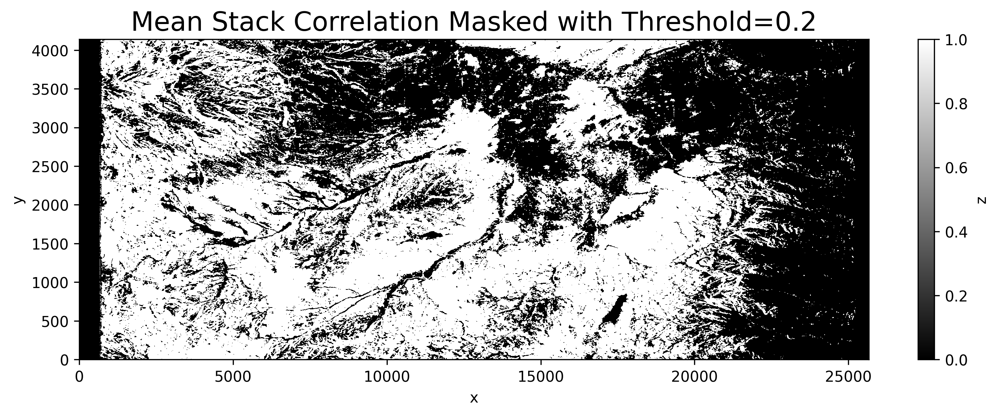

In [19]:
plt.figure(figsize=(12,4), dpi=300)
corr_mask.plot.imshow(vmin=0, vmax=1, cmap='gray')
plt.title(f'Mean Stack Correlation Masked with Threshold={CORRSTACKLIMIT}', fontsize=18)
plt.show()

## Define Custom Mask in Radar Coordinates

## Define Mask in Geography Coordinates

Rectangular area in geographic coordinates looks as irregular rhombus with wavy borders in radar coordinates

## Define Composite Mask

## Unwrapping

Attention: in case of crash on MacOS Apple Silicon run Jupyter as

`OBJC_DISABLE_INITIALIZE_FORK_SAFETY=YES no_proxy='*' jupyter notebook`

In [20]:
# define a post-processing function to crop low-coherence areas
cleaner = lambda corr, unwrap: xr.where(corr>0, unwrap, np.nan)

# define a post-processing function to crop and interpolate low-coherence areas
#cleaner = lambda corr, unwrap: sbas.nearest_grid(xr.where(corr>=CORRLIMIT, unwrap, np.nan))

### Single Scene Test

### Large Area

In [21]:
# tiled SNAPHU config is helpful to unwrap large areas
# use NPROC parameter to define number of cores for the processing, by default all the cores used
#snaphu Exceeded maximum number of secondary arcs
#Decrease TILECOSTTHRESH and/or increase MINREGIONSIZE
conf = sbas.PRM().snaphu_config(NTILEROW=3, NTILECOL=3, ROWOVRLP=400, COLOVRLP=400, NPROC=4,
                                TILECOSTTHRESH=250, MINREGIONSIZE=200, SINGLETILEREOPTIMIZE=True)

In [22]:
# check the generated SNAPHU config and tune the SNAPHU parameters above if needed.
print ('SNAPHU custom config generated:')
print (conf)

SNAPHU custom config generated:

    # basic config
    INFILEFORMAT   FLOAT_DATA
    OUTFILEFORMAT  FLOAT_DATA
    AMPFILEFORMAT  FLOAT_DATA
    CORRFILEFORMAT FLOAT_DATA
    ALTITUDE       693000.0
    EARTHRADIUS    6378000.0
    NEARRANGE      831000
    DR             18.4
    DA             28.2
    RANGERES       28
    AZRES          44
    LAMBDA         0.0554658
    NLOOKSRANGE    1
    NLOOKSAZ       1
    DEFOMAX_CYCLE  0
    TILEDIR        raw_asc/S1_20200817_ALL_F2_snaphu_tiledir
    NPROC          8
    # custom config
    NTILEROW 3
    NTILECOL 3
    ROWOVRLP 400
    COLOVRLP 400
    NPROC 4
    TILECOSTTHRESH 250
    MINREGIONSIZE 200
    SINGLETILEREOPTIMIZE TRUE



In [23]:
%%time

# test on a single interferogram
unwrap, conn = sbas.unwrap(sbas.get_subswath(), pairs.values[0],
                           mask=corr_mask, func=cleaner, conf=conf, conncomp=True)

CPU times: user 1.49 s, sys: 476 ms, total: 1.97 s
Wall time: 34.6 s


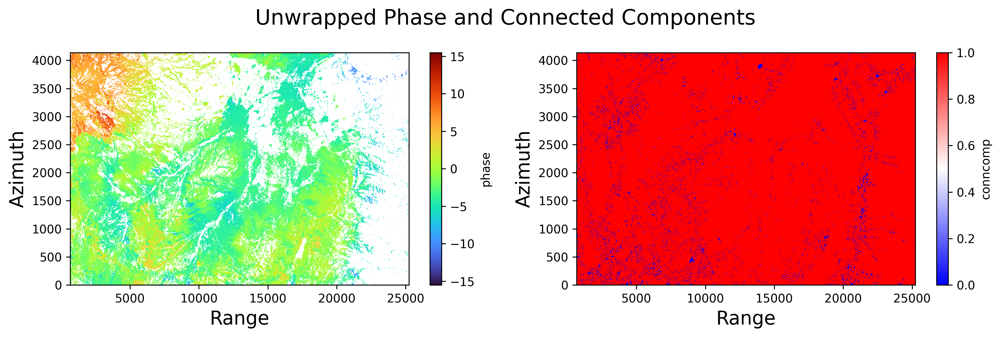

In [24]:
fig = plt.figure(figsize=(12,4), dpi=300)

ax = fig.add_subplot(1, 2, 1)
unwrap.plot.imshow(cmap='turbo', ax=ax)
plt.xlabel('Range', fontsize=16)
plt.ylabel('Azimuth', fontsize=16)
#plt.title('Subswath', fontsize=18)

ax = fig.add_subplot(1, 2, 2)
conn.plot.imshow(cmap='bwr', ax=ax)
plt.xlabel('Range', fontsize=16)
plt.ylabel('Azimuth', fontsize=16)
#plt.title('Subswath', fontsize=18)

plt.suptitle('Unwrapped Phase and Connected Components', fontsize=18)
plt.tight_layout()
plt.show()

In [25]:
# on 8 cores CPU use 4 job for 4-core multi-tile snaphu processing on large areas
# correlation threshold drops low coherence areas on this interferogram
# stack coherency mask drops low coherence areas in average
sbas.unwrap_parallel(pairs, mask=corr_mask, func=cleaner, conf=conf, n_jobs=4)

Unwrapping:   0%|          | 0/139 [00:00<?, ?it/s]

### Small Masked Area with Correlation Threshold

Image cropped to minimum valid mask extent

### Small Masked Area without Correlation Threshold

Image cropped to minimum valid mask extent

In [26]:
# test on a single interferogram
#sbas.unwrap(sbas.get_subswath(), pairs[:1].values[0], mask=user_mask, func=cleaner)

In [27]:
# "FileNotFoundError" SNAPHU error means the processing is not completed normally for some tiles
# try again with different SNAPHU parameters

# interpolate all masked areas on the correlation grid
# fit correlation stack to maybe different interferograms y dimension size
#interpolator = lambda corr, unwrap: sbas.nearest_grid(xr.where(corr_stack.reindex_like(unwrap)>0,unwrap, np.nan))
#sbas.unwrap_parallel(pairs, mask=unwrap_mask, func=interpolator)

## Load and Display Top 50 Unwrapped Phase

In [28]:
# decimate to plot faster
unwraps = sbas.open_grids(pairs[:50], 'unwrap').coarsen({'x': 8, 'y': 8}, boundary='trim').mean()

Loading:   0%|          | 0/50 [00:00<?, ?it/s]

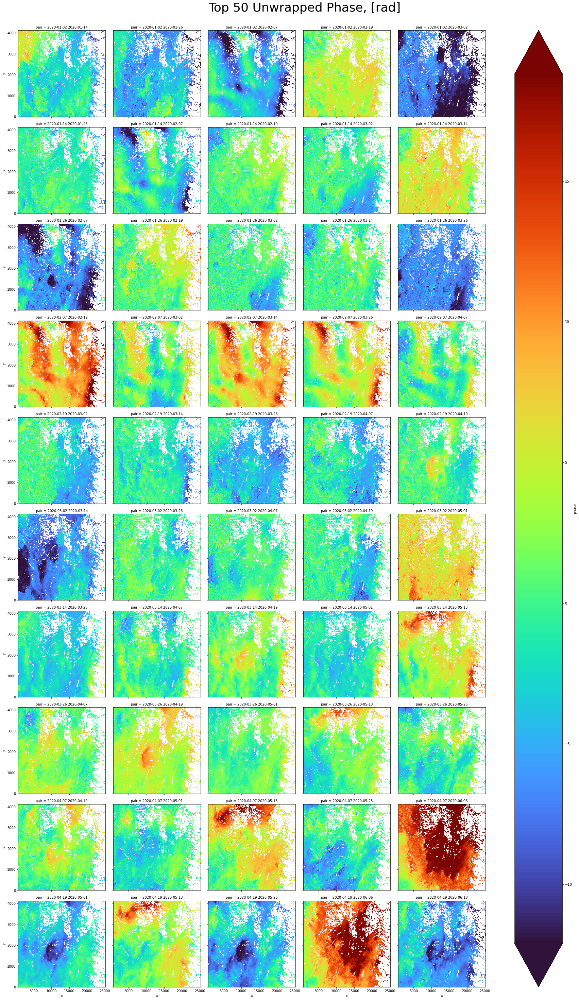

In [29]:
zmin, zmax = np.nanquantile(unwraps, [0.01, 0.99])
fg = unwraps.plot.imshow(
    col='pair',
    col_wrap=5, size=4, aspect=1.2,
    vmin=zmin, vmax=zmax, cmap='turbo'
)
fg.set_ticks(max_xticks=5, max_yticks=5, fontsize='medium')
fg.fig.suptitle('Top 50 Unwrapped Phase, [rad]', y=1.02, fontsize=36)
#plt.savefig(f'Unwrapped Phase, [rad].jpg', dpi=150, quality=95)
plt.show()

## Check and Export Area in Geographic Coordinates

Check if AOI is well covered by computed interferograms area. Low-coherence areas would be cropped on the next step (unwrapping).

In [30]:
# load one grid (pairs[:1]) in geographic coordinates (geocode=True) and cropped to valid extent (crop_valid=True)
unwrap_ll = sbas.open_grids(pairs[:1], 'unwrap', geocode=True, crop_valid=True)[0]

Loading:   0%|          | 0/1 [00:00<?, ?it/s]

In [31]:
# drop the existing file first
filename = f'{WORKDIR}.unwrap.nc'
!rm -fr {filename}
unwrap_ll.to_netcdf(filename)

## Done

All the interferograms processed and unwrapped and project is dumped and can be restored later to continue the analysis. That's safer to create a new notebook for the post-processing because plotting a large timeseries requires a lot of RAM and the notebook can be out of RAM at any time.